# First simple web-map with Folium


**Date**: 22.03.2023

**Course**: Methods of Spatial Analysis. Advanced Level. // HSE, Moscow, spring 2023


## 1. Import libraries


In [6]:
## For working with dataframes

import pandas as pd
import geopandas as gpd
import folium

from shapely import geometry


## 2.Read data from a geojson file


In [7]:
data = gpd.read_file('./okn_points_1.geojson')
data_poly = gpd.read_file('./okn_poly.geojson')
data_poly.head()

,full_id,osm_id,osm_type,building,type,Объект,name,Категория историко-культурного значения,Тип объекта культурного наследия,дата создания,geometry
0,w294901443,294901443,way,yes,None,Жилой дом Бумагина М.Р.,Жилой дом Бумагина М.Р.,Регионального значения,NA,1913 г.,"MULTIPOLYGON (((113.49289 52.03389, 113.49300 ..."
1,w52144801,52144801,way,yes,None,Дом жилой Дупукалова,Дом жилой Дупукалова,Регионального значения,NA,До 1910 г.,"MULTIPOLYGON (((113.50231 52.03658, 113.50243 ..."
2,w51469392,51469392,way,yes,None,Дом купцов Шумовых,Дом купцов Шумовых,Федерального значения,NA,1912-1914 гг.,"MULTIPOLYGON (((113.50702 52.03146, 113.50716 ..."
3,w51714270,51714270,way,yes,None,Мечеть магометанская,Мечеть магометанская,Регионального значения,NA,1909 г.,"MULTIPOLYGON (((113.51727 52.02382, 113.51755 ..."
4,w81345531,81345531,way,yes,None,Дом жилой Капуста Н.М.,Дом жилой Капуста Н.М.,Регионального значения,NA,1911 г.,"MULTIPOLYGON (((113.51895 52.03123, 113.51908 ..."


#### \* clear data and save only valuable attributes

(here is an example how to drop fields, you may need to delete more/less depends, you may choose another way to remove attributes )


In [8]:
data = data.drop(columns=['Тип объекта культурного наследия', 'текстовое описание границ' ])

## 2.Create Grid (fishnet)

- to plot concentration of cultural heritage (or any other point layer) with a choropleth map


#### 2.1. Check CRS of current data and decide do you need to reproject it or not?


- here is an example of reading the current crs and reprojecting geodataframe to another crs (you need to choose by yourself do you need it or not), but I'd rather reccommend to use UTM-zone, when you plot data with folium it is better to choose Web Mercator (EPSG:3857)


In [9]:
print(data.crs.name)

#if you need to reproject you can use .to_crs method
#data = data.to_crs("EPSG:4326")


WGS 84 / UTM zone 49N


#### 2.2. Get the extent of the data


In [10]:
total_bounds = data.total_bounds
minX, minY, maxX, maxY = total_bounds

#### 2.3. Select cell-size


- what are the units?


In [11]:
square_size = 400

#### 2.4. Create fishnet


- you may choose another way to create using QGIS and read prepared data here


In [12]:
grid_cells = []
x, y = (minX, minY)
geom_array = []

while y <= maxY:
        while x <= maxX:
            geom = geometry.Polygon([(x,y), (x, y+square_size), (x+square_size, y+square_size), (x+square_size, y), (x, y)])
            geom_array.append(geom)
            x += square_size
        x = minX
        y += square_size


fishnet = gpd.GeoDataFrame(geom_array, columns=['geometry']).set_crs('EPSG:32649')
fishnet['id'] = fishnet.index

In [13]:
fishnet.head()

,geometry,id
0,"POLYGON ((667830.662 5762549.312, 667830.662 5...",0
1,"POLYGON ((668230.662 5762549.312, 668230.662 5...",1
2,"POLYGON ((668630.662 5762549.312, 668630.662 5...",2
3,"POLYGON ((669030.662 5762549.312, 669030.662 5...",3
4,"POLYGON ((669430.662 5762549.312, 669430.662 5...",4


- save final grid to file if you need it


In [14]:
#fishnet.to_file('grid_okn.gpkg')

## 3. Count Points in Polygon


#### 3.1. Merge fishnet and your points data to count them in polygons


In [15]:
fishnet.explore ()

In [16]:
merged = gpd.sjoin(data, fishnet, how='left', predicate='within')
merged['n'] = 1
dissolve = merged.dissolve(by="index_right", aggfunc="count")
fishnet.loc[dissolve.index, 'n'] = dissolve.n.values


In [17]:
fishnet

,geometry,id,n
0,"POLYGON ((667830.662 5762549.312, 667830.662 5...",0,NaN
1,"POLYGON ((668230.662 5762549.312, 668230.662 5...",1,NaN
2,"POLYGON ((668630.662 5762549.312, 668630.662 5...",2,NaN
3,"POLYGON ((669030.662 5762549.312, 669030.662 5...",3,NaN
4,"POLYGON ((669430.662 5762549.312, 669430.662 5...",4,NaN
...,...,...,...
688,"POLYGON ((679030.662 5770549.312, 679030.662 5...",688,NaN
689,"POLYGON ((679430.662 5770549.312, 679430.662 5...",689,NaN
690,"POLYGON ((679830.662 5770549.312, 679830.662 5...",690,NaN
691,"POLYGON ((680230.662 5770549.312, 680230.662 5...",691,NaN


In [18]:
fishnet.explore ()

#### 3.2. Plot the result


- we do it just to check the final result, no any other practical need


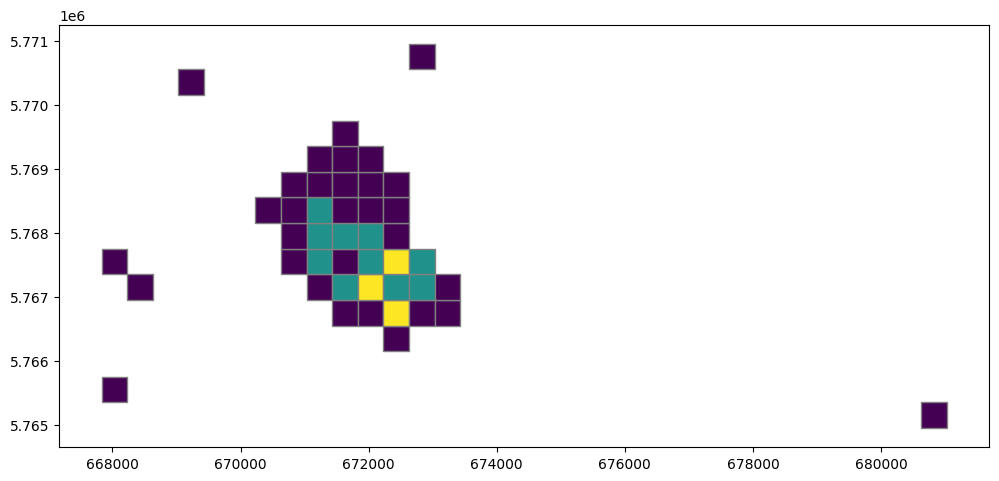

In [19]:
ax = fishnet.plot(column='n', figsize=(12, 8), cmap='viridis', scheme='natural_breaks', k=3, edgecolor="grey")


## 3. Create Web-map


#### 3.1 Map Settings

- carefully look at the function, try to understand what each variable stands for


In [20]:
data = data.to_crs('EPSG:4326')
m = folium.Map(location=[data.centroid.y.mean(), data.centroid.x.mean()], zoom_start=12,  tiles="cartodb positron", control_scale=True)


/var/folders/b4/xd4vn3jj4mb60m3702qd8y440000gn/T/ipykernel_66923/440777897.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[data.centroid.y.mean(), data.centroid.x.mean()], zoom_start=12,  tiles="cartodb positron", control_scale=True)


#### 3.2 Explore the map box. Do we need any changes?


In [21]:
m

In [22]:
board = gpd.read_file('./board.geojson')
board = board.to_crs("EPSG:32649")
folium.GeoJson(
board,
    name = "Граница г. Чита",
    style_function=lambda x:{
         "color":'black'},
         fill_opacity=0.0,
    zoom_on_click=False,
    show=True,
).add_to(m)

In [23]:
m

#### 3.3 Create a Choropleth map based on a fishnet


In [24]:
folium.Choropleth(
    geo_data=fishnet,
    data=fishnet,
    columns=['id', 'n'],
    fill_color='RdPu',
    fill_opacity = 0.7,
    key_on='id',
    nan_fill_opacity=0,
   line_color = "#0000",
   legend_name="Количество объектов культурного наследия в ячейке",
   name='Концентрация объектов культурного наследия'
).add_to(m)

- look a the map


In [25]:
m

#### 3.4 Add heritage buildings with tooltips


- try to color heritage buildings based on their conservation status


In [26]:
#colors = ["orange", "yellow", "green", "blue"]
#categories = data_poly['Категория историко-культурного значения'].unique()

folium.GeoJson(
    data_poly,
    name="Объекты культурного наследия",
    tooltip=folium.GeoJsonTooltip(fields=["Объект"]),
    popup=folium.GeoJsonPopup(fields=["дата создания"]),
    style_function=lambda x: {
        "fillColor": 'grey', "color":'grey'},
    fill_opacity=0.2,
    highlight_function=lambda x: {"fillOpacity": 0.1},
    zoom_on_click=True,
    show=True,
).add_to(m)


- look a the map


In [27]:
m

#### 3.5 Add points cluster


In [28]:
from folium.plugins import MarkerCluster

In [29]:
marker_cluster = MarkerCluster(name='Кластеры объектов культурного наследия')
mc1= folium.plugins.FeatureGroupSubGroup(marker_cluster, 'Кластеры объектов культурного наследия')
m.add_child(marker_cluster)
m.add_child(mc1)
mc1.add_child(folium.GeoJson(data.to_json(), embed=False, show=True))



In [30]:
m

#### 3.6 Add different widgets to map


- import plugins


In [31]:
from folium.plugins import MousePosition
from folium.plugins import Fullscreen

In [32]:
MousePosition().add_to(m)
Fullscreen(
    position="bottomright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)


In [33]:
folium.LayerControl().add_to(m)

In [34]:
m

## 4. Save map to index.html file and prepare to publish it


In [35]:
m.save("index.html")